# **Homework #2: Two-View Geometry and Epipolar Geometry**

In [7]:
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import sys
import random
import numpy as np

# 1. Image Pair Selection and Feature Detection

Images shapes: (1988, 2964, 3) (1988, 2964, 3)
Detected keypoints — Left: 11761, Right: 11928
Saved keypoint visualizations.


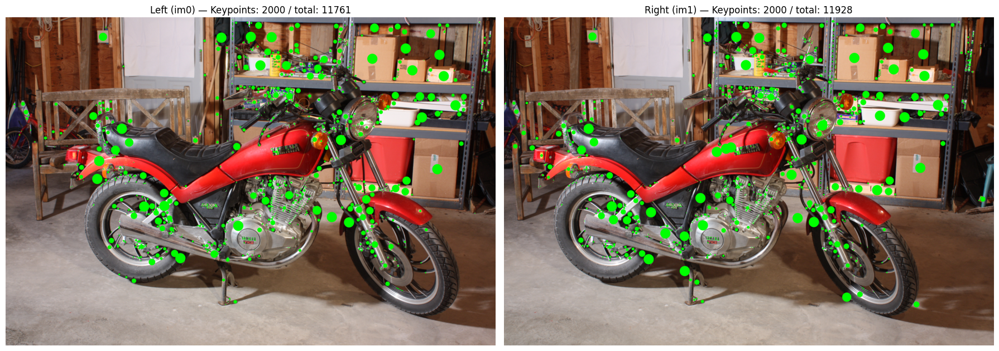

Left (im0): count=11761, mean_x=1569.9, std_x=704.3, mean_y=845.7, std_y=427.4
Right (im1): count=11928, mean_x=1458.2, std_x=690.5, mean_y=804.2, std_y=419.9


In [8]:
LEFT_IMAGE  = "im0.png"   
RIGHT_IMAGE = "im1.png"
OUT_DIR = Path("section1")
OUT_DIR.mkdir(parents=True, exist_ok=True)

def create_sift():
    if hasattr(cv2, "SIFT_create"):
        return cv2.SIFT_create()
    try:
        return cv2.xfeatures2d.SIFT_create()
    except Exception as e:
        raise RuntimeError("Error! SIFT not available.") from e

def load_color(path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot load image: {path}")
    return img  

def draw_filled_keypoints_rgb(img_bgr, keypoints, radius_scale=0.35, min_r=2, max_r=30):
    canvas = img_bgr.copy()
    for kp in keypoints:
        x, y = int(round(kp.pt[0])), int(round(kp.pt[1]))
        raw_size = float(kp.size) if getattr(kp, "size", None) is not None else 6.0
        r = int(round((raw_size / 2.0) * radius_scale))
        if r < min_r:
            r = min_r
        if r > max_r:
            r = max_r
        cv2.circle(canvas, (x, y), r, color=(0, 255, 0), thickness=-1, lineType=cv2.LINE_AA)

    return canvas

def extract_and_visualize_keypoints(left_path=LEFT_IMAGE, right_path=RIGHT_IMAGE):
    imgL = load_color(left_path)
    imgR = load_color(right_path)
    print("Images shapes:", imgL.shape, imgR.shape)

    sift = create_sift()
    kpL, desL = sift.detectAndCompute(cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY), None)
    kpR, desR = sift.detectAndCompute(cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY), None)
    print(f"Detected keypoints — Left: {len(kpL)}, Right: {len(kpR)}")

    MAX_VIS = 2000
    kpL_vis  = sorted(kpL, key=lambda k: -k.response)[:MAX_VIS]
    kpR_vis  = sorted(kpR, key=lambda k: -k.response)[:MAX_VIS]
    canvasL = draw_filled_keypoints_rgb(imgL, kpL_vis , radius_scale=1.0, min_r=2, max_r=30)
    canvasR = draw_filled_keypoints_rgb(imgR, kpR_vis , radius_scale=1.0, min_r=2, max_r=30)

    outL = OUT_DIR / "im0_keypoints.png"
    outR = OUT_DIR / "im1_keypoints.png"
    cv2.imwrite(str(outL), canvasL)
    cv2.imwrite(str(outR), canvasR)
    print("Saved keypoint visualizations.")

    try:
        import matplotlib.pyplot as plt
        canvasL_rgb = cv2.cvtColor(canvasL, cv2.COLOR_BGR2RGB)
        canvasR_rgb = cv2.cvtColor(canvasR, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(18,9))
        plt.subplot(1,2,1); plt.imshow(canvasL_rgb); plt.title(f"Left (im0) — Keypoints: {len(kpL_vis)} / total: {len(kpL)}"); plt.axis('off')
        plt.subplot(1,2,2); plt.imshow(canvasR_rgb); plt.title(f"Right (im1) — Keypoints: {len(kpR_vis)} / total: {len(kpR)}"); plt.axis('off')
        plt.tight_layout()
        plt.show()
    except Exception:
        pass

    xsL = np.array([kp.pt[0] for kp in kpL]) if len(kpL) else np.array([])
    ysL = np.array([kp.pt[1] for kp in kpL]) if len(kpL) else np.array([])
    xsR = np.array([kp.pt[0] for kp in kpR]) if len(kpR) else np.array([])
    ysR = np.array([kp.pt[1] for kp in kpR]) if len(kpR) else np.array([])

    def print_stats(xs, ys, name):
        if xs.size == 0:
            print(f"{name}: no keypoints")
            return
        print(f"{name}: count={xs.size}, mean_x={xs.mean():.1f}, std_x={xs.std():.1f}, mean_y={ys.mean():.1f}, std_y={ys.std():.1f}")

    print_stats(xsL, ysL, "Left (im0)")
    print_stats(xsR, ysR, "Right (im1)")

    return {
        "kpL": kpL, "desL": desL, "imgL": imgL,
        "kpR": kpR, "desR": desR, "imgR": imgR,
        "out_paths": (outL, outR)
    }

if __name__ == "__main__":
    results = extract_and_visualize_keypoints()

#  2. Feature Matching and Correspondence

Left keypoints: 11761, Right keypoints: 11928
Ratio test: 4056 matches (from 11761)

MATCHING REPORT:
Initial matches: 11761
After Lowe ratio: 4056
Inliers (RANSAC): 3407
Outliers: 649
Inlier survival percent: 84.00%

Fundamental Matrix (F):
 [[  0.        -0.000764   0.517887]
 [  0.000748  -0.000068 -11.023944]
 [ -0.508558  11.0539     1.      ]]


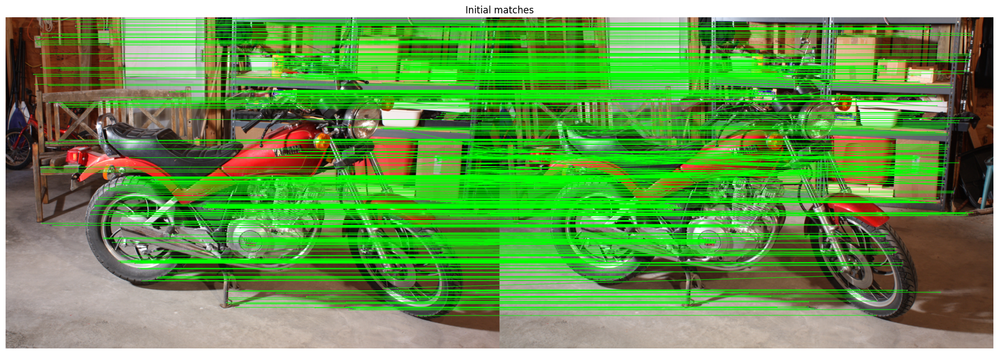

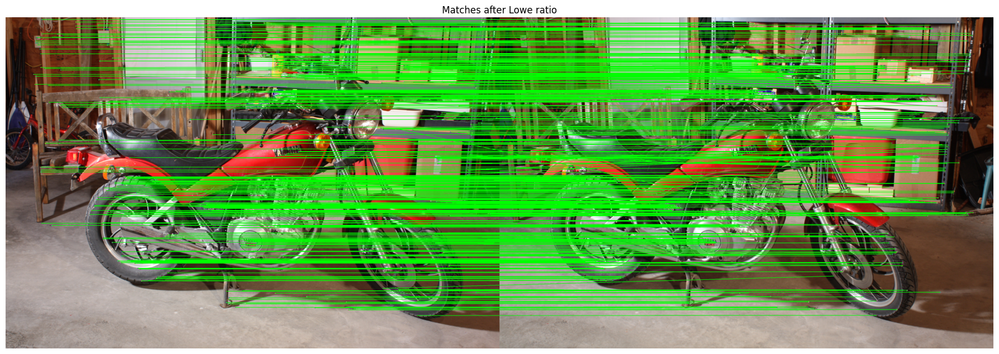

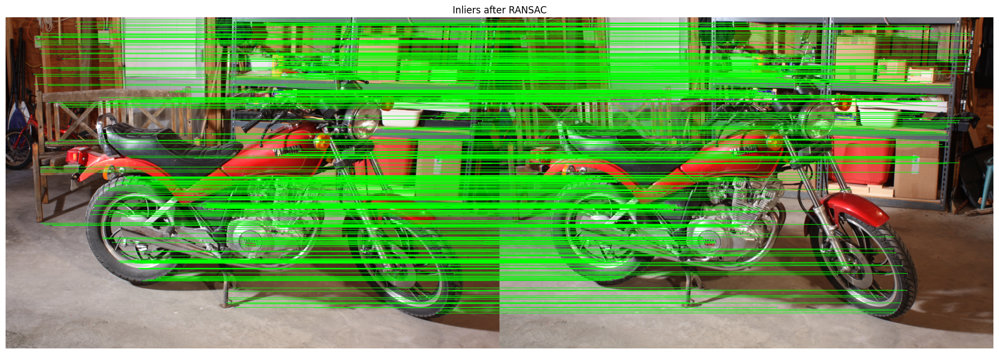

In [9]:
OUT_DIR = Path("section2")
OUT_DIR.mkdir(parents=True, exist_ok=True)

LOWE_RATIO = 0.75
RANSAC_REPROJ_THRESHOLD = 2.0
RANSAC_CONFIDENCE = 0.99
VIS_SHOW_N = 500   

def create_sift():
    if hasattr(cv2, "SIFT_create"):
        return cv2.SIFT_create()
    try:
        return cv2.xfeatures2d.SIFT_create()
    except Exception:
        raise RuntimeError("Error! SIFT not available.")

def load_color(path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot load: {path}")
    return img

def draw_matches(img1, kp1, img2, kp2, matches, out_path, max_draw=600, title=None):
    h1, w1 = img1.shape[:2]
    if len(matches) > max_draw:
        matches = sorted(matches, key=lambda m: m.distance)[:max_draw]

    out_img = cv2.drawMatches(
        img1, kp1, img2, kp2, matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )

    out_rgb = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)

    for m in matches:
        x1, y1 = map(int, kp1[m.queryIdx].pt)
        x2, y2 = map(int, kp2[m.trainIdx].pt)
        x2_shifted = x2 + w1   
        cv2.line(out_rgb, (x1, y1), (x2_shifted, y2), (0,255,0), 2)

    out_bgr = cv2.cvtColor(out_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(out_path), out_bgr)

    try:
        plt.figure(figsize=(18,9))
        plt.imshow(out_rgb)
        if title: plt.title(title)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    except:
        pass

def match_and_ransac(imgL, imgR):
    sift = create_sift()
    grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY)
    grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)

    kpL, desL = sift.detectAndCompute(grayL, None)
    kpR, desR = sift.detectAndCompute(grayR, None)
    print(f"Left keypoints: {len(kpL)}, Right keypoints: {len(kpR)}")

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    knn = bf.knnMatch(desL, desR, k=2)
    initial_matches = [m_n[0] for m_n in knn if len(m_n) >= 1]
    good_matches = []
    for pair in knn:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < LOWE_RATIO * n.distance:
            good_matches.append(m)
    print(f"Ratio test: {len(good_matches)} matches (from {len(initial_matches)})")

    ptsL = np.float32([kpL[m.queryIdx].pt for m in good_matches])
    ptsR = np.float32([kpR[m.trainIdx].pt for m in good_matches])

    F, mask = cv2.findFundamentalMat(
        ptsL, ptsR,
        cv2.FM_RANSAC,
        ransacReprojThreshold=RANSAC_REPROJ_THRESHOLD,
        confidence=RANSAC_CONFIDENCE
    )

    if F is None:
        raise RuntimeError("Fundamental matrix estimation failed!")

    mask = mask.ravel().astype(bool)
    inlier_matches = [m for m, inl in zip(good_matches, mask) if inl]
    outlier_matches = [m for m, inl in zip(good_matches, mask) if not inl]

    stats = {
        "initial_matches": len(initial_matches),
        "ratio_matches": len(good_matches),
        "inliers": len(inlier_matches),
        "outliers": len(outlier_matches),
        "inlier_ratio": 100 * len(inlier_matches) / max(1, len(good_matches)),
        "F": F
    }
    return kpL, kpR, initial_matches, good_matches, inlier_matches, stats

if __name__ == "__main__":
    imgL = load_color(LEFT_IMAGE)
    imgR = load_color(RIGHT_IMAGE)

    (kpL, kpR,
     initial_matches,
     good_matches,
     inlier_matches,
     stats) = match_and_ransac(imgL, imgR)

    print("\nMATCHING REPORT:")
    print("Initial matches:", stats["initial_matches"])
    print("After Lowe ratio:", stats["ratio_matches"])
    print("Inliers (RANSAC):", stats["inliers"])
    print("Outliers:", stats["outliers"])
    print("Inlier survival percent: %.2f%%" % stats["inlier_ratio"])
    print("\nFundamental Matrix (F):\n", stats["F"])

    draw_matches(
        imgL, kpL, imgR, kpR,
        initial_matches,
        OUT_DIR /"matches_initial.png",
        title="Initial matches"
    )

    draw_matches(
        imgL, kpL, imgR, kpR,
        good_matches,
        OUT_DIR /"matches_filtered_ratio.png",
        title="Matches after Lowe ratio"
    )

    draw_matches(
        imgL, kpL, imgR, kpR,
        inlier_matches,
        OUT_DIR /"matches_inliers_ransac.png",
        title="Inliers after RANSAC"
    )

#  3. Fundamental Matrix Estimation and Epipolar Geometry

In [ ]:
OUT_DIR = Path("section3")
OUT_DIR.mkdir(exist_ok=True, parents=True)

def normalize_points(pts):
    pts = np.asarray(pts, dtype=np.float64)
    mean = pts.mean(axis=0)
    pts_c = pts - mean
    dists = np.sqrt((pts_c**2).sum(axis=1))
    mean_dist = dists.mean()
    if mean_dist == 0:
        s = 1.0
    else:
        s = np.sqrt(2) / mean_dist
    T = np.array([[s, 0, -s*mean[0]],
                  [0, s, -s*mean[1]],
                  [0, 0, 1]], dtype=np.float64)
    ones = np.ones((pts.shape[0],1))
    pts_h = np.hstack([pts, ones])
    pts_nh = (T @ pts_h.T).T
    pts_norm = pts_nh[:, :2] / pts_nh[:, 2:3]
    return pts_norm, T

def eight_point_normalized(pts1, pts2):
    assert pts1.shape == pts2.shape
    n = pts1.shape[0]
    if n < 8:
        raise ValueError("Need at least 8 correspondences for 8-point algorithm")

    pts1_n, T1 = normalize_points(pts1)
    pts2_n, T2 = normalize_points(pts2)

    A = np.zeros((n,9), dtype=np.float64)
    x = pts1_n[:,0]; y = pts1_n[:,1]
    xp = pts2_n[:,0]; yp = pts2_n[:,1]
    A[:,0] = xp * x
    A[:,1] = xp * y
    A[:,2] = xp
    A[:,3] = yp * x
    A[:,4] = yp * y
    A[:,5] = yp
    A[:,6] = x
    A[:,7] = y
    A[:,8] = 1.0

    U, S, Vt = np.linalg.svd(A)
    f = Vt[-1,:]  
    F_norm = f.reshape(3,3)
    U_f, S_f, Vt_f = np.linalg.svd(F_norm)
    S_f[-1] = 0.0
    F_norm_rank2 = U_f @ np.diag(S_f) @ Vt_f
    F = T2.T @ F_norm_rank2 @ T1
    F = F / np.linalg.norm(F)
    return F

def compute_epipole(F):
    U, S, Vt = np.linalg.svd(F)
    e = Vt[-1,:]
    return e / e[2]

def draw_epilines(imgA_path, imgB_path, ptsA, F, which='AtoB', n_draw=10, save_path=None):
    imgA = cv2.imread(str(imgA_path))
    imgB = cv2.imread(str(imgB_path))
    if imgA is None or imgB is None:
        raise FileNotFoundError("Cannot load images")
    imgA_vis = imgA.copy()
    imgB_vis = imgB.copy()

    idxs = list(range(len(ptsA)))
    random.shuffle(idxs)
    sel = idxs[:min(n_draw, len(idxs))]
    pts_sel = ptsA[sel]

    for (x,y) in pts_sel.astype(int):
        cv2.circle(imgA_vis, (int(x),int(y)), 4, (0,255,0), -1, lineType=cv2.LINE_AA)

    if which == 'AtoB':
        pts_h = np.hstack([pts_sel, np.ones((len(pts_sel),1))])
        lines = (F @ pts_h.T).T  
    else: 
        pts_h = np.hstack([pts_sel, np.ones((len(pts_sel),1))])
        lines = (F.T @ pts_h.T).T

    hB, wB = imgB_vis.shape[:2]
    for l in lines:
        a,b,c = l
        if abs(b) > 1e-8:
            x0, y0 = 0, int(-c / b)
            x1, y1 = wB, int(-(c + a*wB) / b)
        else:
            x0 = int(-c / a)
            y0 = 0
            x1 = x0
            y1 = hB
        cv2.line(imgB_vis, (x0,y0), (x1,y1), (0,255,0), 2, lineType=cv2.LINE_AA)

    e_right = compute_epipole(F)      
    e_left  = compute_epipole(F.T)   

    ex_r, ey_r = int(round(e_right[0])), int(round(e_right[1]))
    ex_l, ey_l = int(round(e_left[0])), int(round(e_left[1]))
    def clamp(pt, w,h):
        x,y = pt
        x = max(0, min(w-1, x))
        y = max(0, min(h-1, y))
        return x,y

    ex_r_c, ey_r_c = clamp((ex_r, ey_r), imgB_vis.shape[1], imgB_vis.shape[0])
    ex_l_c, ey_l_c = clamp((ex_l, ey_l), imgA_vis.shape[1], imgA_vis.shape[0])
    cv2.circle(imgB_vis, (ex_r_c, ey_r_c), 8, (0,0,255), -1, lineType=cv2.LINE_AA)
    cv2.circle(imgA_vis, (ex_l_c, ey_l_c), 8, (0,0,255), -1, lineType=cv2.LINE_AA)

    cv2.putText(imgB_vis, "epipole (red)", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,255), 2)
    cv2.putText(imgA_vis, "selected pts (green), epipole (red)", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)

    if save_path is None:
        save_path = OUT_DIR / f"epilines_{which}.png"
    cv2.imwrite(str(save_path), np.hstack([imgA_vis, imgB_vis]))
    return imgA_vis, imgB_vis, (e_left, e_right), save_path

def compute_epipolar_geometry(use_existing_from_workspace=True):
    caller = sys.modules['__main__']
    have_prev = all(hasattr(caller, v) for v in ("kpL","kpR","good_matches","inlier_matches","stats") )

    if use_existing_from_workspace and have_prev:
        kpL = caller.kpL
        kpR = caller.kpR
        good_matches = caller.good_matches
        inlier_matches = caller.inlier_matches
        F_opencv = caller.stats["F"]
    else:
        sift = cv2.SIFT_create()
        imgL = cv2.imread(LEFT_IMAGE); imgR = cv2.imread(RIGHT_IMAGE)
        grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY); grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)
        kpL, desL = sift.detectAndCompute(grayL, None)
        kpR, desR = sift.detectAndCompute(grayR, None)
        bf = cv2.BFMatcher(cv2.NORM_L2)
        knn = bf.knnMatch(desL, desR, k=2)
        initial_matches = [m_n[0] for m_n in knn if len(m_n)>=1]

        LOWE_RATIO = 0.75
        good_matches = []
        for pair in knn:
            if len(pair) < 2: continue
            m,n = pair
            if m.distance < LOWE_RATIO * n.distance:
                good_matches.append(m)
        ptsL = np.float32([kpL[m.queryIdx].pt for m in good_matches])
        ptsR = np.float32([kpR[m.trainIdx].pt for m in good_matches])
        F_opencv, mask = cv2.findFundamentalMat(ptsL, ptsR, cv2.FM_RANSAC, ransacReprojThreshold=2.0, confidence=0.99)
        mask = mask.ravel().astype(bool)
        inlier_matches = [m for m, inl in zip(good_matches, mask) if inl]

    ptsL_in = np.float64([kpL[m.queryIdx].pt for m in inlier_matches])
    ptsR_in = np.float64([kpR[m.trainIdx].pt for m in inlier_matches])
    print(f"Using {len(ptsL_in)} inlier correspondences for F estimation.")
    if ptsL_in.shape[0] < 8:
        raise RuntimeError("Not enough inliers to estimate F!")

    F_eight = eight_point_normalized(ptsL_in, ptsR_in)
    try:
        F_opencv
    except NameError:
        F_opencv = None

    np.set_printoptions(suppress=True, precision=6, linewidth=200)
    print("\nEstimated Fundamental Matrix (Normalized 8-point, rank-2 enforced):\n", F_eight)
    if F_opencv is not None:
        print("\nEstimated Fundamental Matrix (OpenCV RANSAC output):\n", F_opencv / np.linalg.norm(F_opencv))

    ones = np.ones((ptsL_in.shape[0],1))
    x_h = np.hstack([ptsL_in, ones])
    x2_h = np.hstack([ptsR_in, ones])
    vals = np.abs(np.einsum('ij,ij->i', x2_h @ F_eight, x_h))  # x'^T F x
    print("\n count:", vals.size,  "  mean:", vals.mean(),  "  max:", vals.max(),  "  median:", np.median(vals))

    if F_opencv is not None:
        vals_cv = np.abs(np.einsum('ij,ij->i', x2_h @ (F_opencv/np.linalg.norm(F_opencv)), x_h))
        print(" OpenCV F residuals: mean:", vals_cv.mean(),  "  max:", vals_cv.max(),  "  median:", np.median(vals_cv))

    n_draw = 10
    random.seed(42)
    sel_idx = random.sample(range(len(inlier_matches)), n_draw)
    ptsL_sel = ptsL_in[sel_idx]
    ptsR_sel = ptsR_in[sel_idx]
    imgL_vis, imgR_vis, (eL, eR), _ = draw_epilines(LEFT_IMAGE, RIGHT_IMAGE, ptsL_sel, F_eight, which='AtoB', n_draw=n_draw, save_path=OUT_DIR/"epilines_left_to_right.png")
    imgL_vis2, imgR_vis2, _, _ = draw_epilines(LEFT_IMAGE, RIGHT_IMAGE, ptsR_sel, F_eight, which='BtoA', n_draw=n_draw, save_path=OUT_DIR/"epilines_right_to_left.png")
    eL = np.array(eL).reshape(3,)
    eR = np.array(eR).reshape(3,)
    with open(OUT_DIR/"epipoles_coords.txt","w") as f:
        f.write("epipole_left (homogeneous): "+np.array2string(eL, precision=6)+"\n")
        f.write("epipole_right (homogeneous): "+np.array2string(eR, precision=6)+"\n")

    return {
        "F_eight": F_eight,
        "F_opencv": F_opencv,
        "ptsL_in": ptsL_in,
        "ptsR_in": ptsR_in,
        "epipoles": (eL, eR),
        "epilines_images": (OUT_DIR/"epilines_left_to_right.png", OUT_DIR/"epilines_right_to_left.png")
    }

res = compute_epipolar_geometry(use_existing_from_workspace=True)

Using 3407 inlier correspondences for F estimation.

Estimated Fundamental Matrix (Normalized 8-point, rank-2 enforced):
 [[-0.        0.000008 -0.006169]
 [-0.000008  0.000001  0.5549  ]
 [ 0.006092 -0.555649  0.619084]]

Estimated Fundamental Matrix (OpenCV RANSAC output):
 [[ 0.       -0.000049  0.03307 ]
 [ 0.000048 -0.000004 -0.703945]
 [-0.032474  0.705858  0.063856]]

 count: 3407   mean: 0.17610012650703327   max: 3.4461772173957286   median: 0.10788381345750508
 OpenCV F residuals: mean: 0.5571745731124865   max: 1.3812461579063395   median: 0.5168115370418036


#  4. Essential Matrix and Camera Motion Recovery

In [11]:
CALIB_FILE = "calib.txt"
OUT_DIR = Path("section4")
OUT_DIR.mkdir(parents=True, exist_ok=True)

def load_K_middlebury(path):
    with open(path, "r") as f:
        lines = f.readlines()
    K0 = None
    K1 = None

    for line in lines:
        if line.startswith("cam0"):
            K0 = line.split("=")[1].strip()
        if line.startswith("cam1"):
            K1 = line.split("=")[1].strip()

    def parse_K(s):
        s = s.replace("[","").replace("]","")
        rows = s.split(";")
        K = []
        for r in rows:
            nums = [float(x) for x in r.strip().split()]
            K.append(nums)
        return np.array(K, dtype=np.float64)
    return parse_K(K0), parse_K(K1)

def essential_from_F(F, K):
    E = K.T @ F @ K
    return E

def decompose_E(E):
    U, S, Vt = np.linalg.svd(E)
    E = U @ np.diag([1,1,0]) @ Vt
    U, _, Vt = np.linalg.svd(E)
    W = np.array([[ 0, -1,  0],
                  [ 1,  0,  0],
                  [ 0,  0,  1]])

    R1 = U @ W @ Vt
    R2 = U @ W.T @ Vt
    t  = U[:, 2]

    if np.linalg.det(R1) < 0: R1 = -R1
    if np.linalg.det(R2) < 0: R2 = -R2
    return [
        (R1,  t),
        (R1, -t),
        (R2,  t),
        (R2, -t)
    ]

def cheirality(R, t, pts1, pts2, K):
    P1 = K @ np.hstack((np.eye(3), np.zeros((3,1))))
    P2 = K @ np.hstack((R, t.reshape(3,1)))

    pts1_px = pts1.T  
    pts2_px = pts2.T
    pts4D = cv2.triangulatePoints(P1, P2, pts1_px, pts2_px)
    pts3D = pts4D[:3] / pts4D[3]

    Z1 = pts3D[2]
    Z2 = (R @ pts3D + t.reshape(3,1))[2]
    return np.sum((Z1 > 0) & (Z2 > 0))

K0, K1 = load_K_middlebury(CALIB_FILE)
print("K0 =\n", K0)
print("K1 =\n", K1)

K = K0
F = res["F_eight"]
E = essential_from_F(F, K)
np.savetxt(OUT_DIR/"essential_matrix.txt", E, fmt="%.6f")
print("\nEssential matrix (E) =\n", E)

solutions = decompose_E(E)
print("\nExtracted 4 possible (R,t) solutions:")

pts1 = res["ptsL_in"]
pts2 = res["ptsR_in"]

scores = []
for i, (R, t) in enumerate(solutions):
    c = cheirality(R, t, pts1, pts2, K)
    scores.append(c)
    print(f"Solution {i+1}: {c} points")

best = int(np.argmax(scores))
R_final, t_final = solutions[best]
if t_final[0] < 0:
    t_final = -t_final

print("Selected solution:", best+1)
print("\nR =\n", R_final)
print("t =\n", t_final / np.linalg.norm(t_final))

np.savetxt(OUT_DIR/"R_final.txt", R_final, fmt="%.6f")
np.savetxt(OUT_DIR/"t_final.txt", t_final/np.linalg.norm(t_final), fmt="%.6f")

with open(OUT_DIR/"selected_solution.txt","w") as f:
    f.write(f"Selected solution = {best+1}\n")
    f.write("Reason: cheirality (maximum points in front)\n")

K0 =
 [[3979.911    0.    1244.772]
 [   0.    3979.911 1019.507]
 [   0.       0.       1.   ]]
K1 =
 [[3979.911    0.    1369.115]
 [   0.    3979.911 1019.507]
 [   0.       0.       1.   ]]

Essential matrix (E) =
 [[   -0.008992   123.888981     7.1816  ]
 [ -121.709656    14.364859  2174.065024]
 [   -6.933121 -2169.007525     0.876003]]

Extracted 4 possible (R,t) solutions:
Solution 1: 3407 points
Solution 2: 0 points
Solution 3: 0 points
Solution 4: 0 points
Selected solution: 1

R =
 [[ 0.999999 -0.000048 -0.0011  ]
 [ 0.000044  0.999994 -0.003501]
 [ 0.0011    0.003501  0.999993]]
t =
 [ 0.998369 -0.003321  0.057003]


#  5. Triangulation and 3D Reconstruction

Mean reprojection error (both cams): 6.2747 pixels
Mean reprojection error left/right: 6.2676, 6.2818


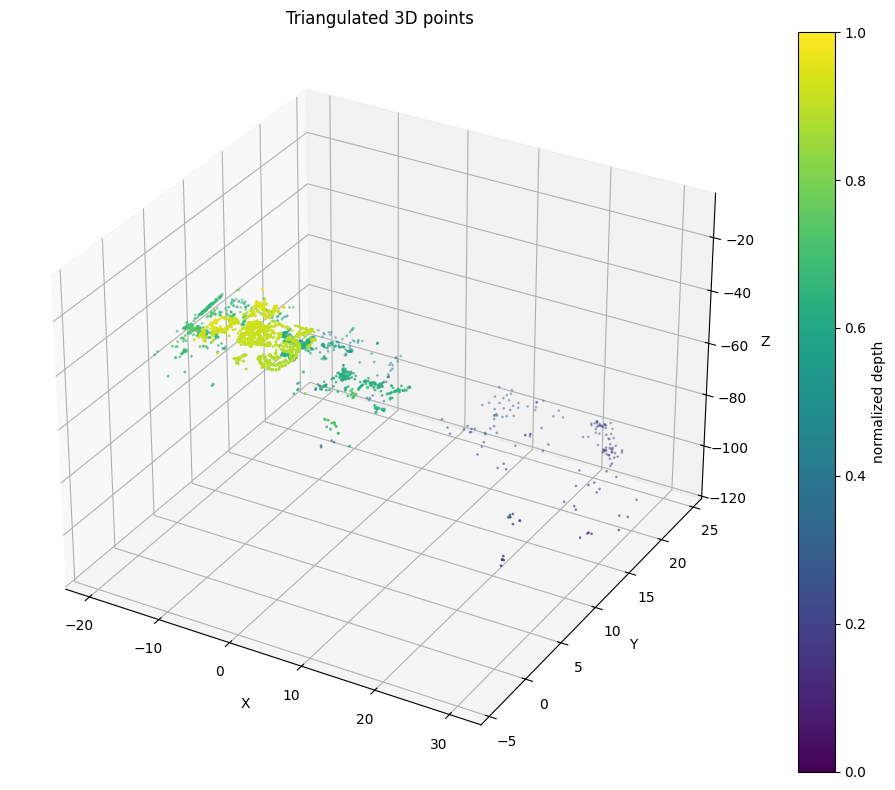

In [12]:
OUT_DIR = Path("section5")
OUT_DIR.mkdir(exist_ok=True, parents=True)

def load_K_middlebury(path="calib.txt"):
    with open(path,"r") as f:
        lines = f.readlines()
    K0 = None; K1 = None
    for line in lines:
        if line.startswith("cam0"):
            K0 = line.split("=")[1].strip()
        if line.startswith("cam1"):
            K1 = line.split("=")[1].strip()
    def parse_K(s):
        s = s.replace("[","").replace("]","")
        rows = s.split(";")
        K = []
        for r in rows:
            nums = [float(x) for x in r.strip().split()]
            K.append(nums)
        return np.array(K, dtype=np.float64)
    return parse_K(K0), parse_K(K1)

def linear_triangulation_point(P1, P2, x1, x2):
    A = np.zeros((4,4), dtype=np.float64)
    A[0] = x1[0]*P1[2] - P1[0]
    A[1] = x1[1]*P1[2] - P1[1]
    A[2] = x2[0]*P2[2] - P2[0]
    A[3] = x2[1]*P2[2] - P2[1]
    _,_,Vt = np.linalg.svd(A)
    X = Vt[-1]
    X = X/X[3]
    return X[:3]

def reproj_error(P, X3, x_obs):
    Xh = np.hstack([X3, 1.0])
    xproj = P @ Xh
    xproj = xproj[:2] / xproj[2]
    err = np.linalg.norm(xproj - x_obs)
    return err, xproj

def save_ply(filename, points, colors=None):
    n = points.shape[0]
    with open(filename, "w") as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {n}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        if colors is not None:
            f.write("property uchar red\nproperty uchar green\nproperty uchar blue\n")
        f.write("end_header\n")

        for i in range(n):
            p = points[i]
            if colors is None:
                f.write(f"{p[0]} {p[1]} {p[2]}\n")
            else:
                c = colors[i].astype(int)
                f.write(f"{p[0]} {p[1]} {p[2]} {c[0]} {c[1]} {c[2]}\n")

caller = sys.modules['__main__']
use_workspace = all(hasattr(caller, v) for v in ("res","K","R_final","t_final","kpL","kpR","inlier_matches"))

if use_workspace:
    ptsL = np.array(caller.res["ptsL_in"])
    ptsR = np.array(caller.res["ptsR_in"])
    K = caller.K if hasattr(caller, "K") else (caller.K0 if hasattr(caller, "K0") else None)
    R = caller.R_final
    t = caller.t_final
    kpL = caller.kpL; kpR = caller.kpR; inlier_matches = caller.inlier_matches
else:
    K0,K1 = load_K_middlebury(CALIB_FILE)
    K = K0
    imgL = cv2.imread(LEFT_IMAGE); imgR = cv2.imread(RIGHT_IMAGE)
    grayL = cv2.cvtColor(imgL, cv2.COLOR_BGR2GRAY); grayR = cv2.cvtColor(imgR, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()

    kpL, desL = sift.detectAndCompute(grayL, None)
    kpR, desR = sift.detectAndCompute(grayR, None)
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    knn = bf.knnMatch(desL, desR, k=2)
    good_matches = []

    for pair in knn:
        if len(pair) < 2: continue
        m,n = pair
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    if len(good_matches) < 8:
        raise RuntimeError("Not enough good matches")
    
    ptsL_all = np.float32([kpL[m.queryIdx].pt for m in good_matches])
    ptsR_all = np.float32([kpR[m.trainIdx].pt for m in good_matches])
    F, mask = cv2.findFundamentalMat(ptsL_all, ptsR_all, cv2.FM_RANSAC, ransacReprojThreshold=2.0, confidence=0.99)
    
    mask = mask.ravel().astype(bool)
    inlier_matches = [m for m, inl in zip(good_matches, mask) if inl]
    ptsL = np.array([kpL[m.queryIdx].pt for m in inlier_matches])
    ptsR = np.array([kpR[m.trainIdx].pt for m in inlier_matches])

    E = K.T @ F @ K
    E = E / np.linalg.norm(E)
    retval, R1, R2, tvec = cv2.decomposeEssentialMat(E)
    cand = [(R1, tvec.reshape(3,)), (R1, -tvec.reshape(3,)), (R2, tvec.reshape(3,)), (R2, -tvec.reshape(3,))]
    best = None; best_count = -1
    P1 = K @ np.hstack((np.eye(3), np.zeros((3,1))))

    for (R_c, t_c) in cand:
        P2_c = K @ np.hstack((R_c, t_c.reshape(3,1)))
        selN = min(200, ptsL.shape[0])
        sel_idx = np.random.choice(range(ptsL.shape[0]), selN, replace=False)
        pts1_u = cv2.undistortPoints(ptsL[sel_idx].reshape(-1,1,2), K, None).reshape(-1,2)
        pts2_u = cv2.undistortPoints(ptsR[sel_idx].reshape(-1,1,2), K, None).reshape(-1,2)
        pts4 = cv2.triangulatePoints(P1, P2_c, pts1_u.T, pts2_u.T)
        pts3 = pts4[:3] / pts4[3]
        Z1 = pts3[2]
        Z2 = (R_c @ pts3 + t_c.reshape(3,1))[2]
        cnt = np.sum((Z1>0)&(Z2>0))

        if cnt > best_count:
            best_count = cnt; best = (R_c, t_c)
    R, t = best

ptsL = np.asarray(ptsL, dtype=np.float64)
ptsR = np.asarray(ptsR, dtype=np.float64)
K = np.asarray(K, dtype=np.float64)
R = np.asarray(R, dtype=np.float64)
t = np.asarray(t, dtype=np.float64).reshape(3,)

P1 = K @ np.hstack((np.eye(3), np.zeros((3,1))))
P2 = K @ np.hstack((R, t.reshape(3,1)))
N = ptsL.shape[0]
points_3d = np.zeros((N,3), dtype=np.float64)

for i in range(N):
    X = linear_triangulation_point(P1, P2, ptsL[i], ptsR[i])
    points_3d[i] = X
reproj_errs = []
reproj_left_pts = []
reproj_right_pts = []

for i in range(N):
    errL, xLproj = reproj_error(P1, points_3d[i], ptsL[i])
    errR, xRproj = reproj_error(P2, points_3d[i], ptsR[i])
    reproj_errs.append((errL, errR))
    reproj_left_pts.append(xLproj)
    reproj_right_pts.append(xRproj)

reproj_errs = np.array(reproj_errs)
reproj_left_pts = np.array(reproj_left_pts)
reproj_right_pts = np.array(reproj_right_pts)
mean_err = reproj_errs.mean()
mean_err_per_cam = reproj_errs.mean(axis=0)

print(f"Mean reprojection error (both cams): {mean_err:.4f} pixels")
print(f"Mean reprojection error left/right: {mean_err_per_cam[0]:.4f}, {mean_err_per_cam[1]:.4f}")

np.save(OUT_DIR/"point_cloud.npy", points_3d)
depths = points_3d[:,2].copy()
depths_vis = depths.copy()
valid_mask = depths_vis > 0

if np.any(valid_mask):
    min_d = depths_vis[valid_mask].min()
    depths_vis = depths_vis - min_d
else:
    depths_vis = depths_vis - depths_vis.min()
d_norm = (depths_vis - depths_vis.min()) / (depths_vis.max() - depths_vis.min() + 1e-12)
cmap = plt.get_cmap("viridis")
colors = (cmap(d_norm)[:,:3] * 255).astype(np.uint8)
save_ply(OUT_DIR/"point_cloud.ply", points_3d, colors)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(points_3d[:,0], points_3d[:,1], points_3d[:,2], c=d_norm, cmap="viridis", s=1)
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
ax.set_title("Triangulated 3D points")
fig.colorbar(sc, label="normalized depth")
plt.tight_layout()
plt.savefig(OUT_DIR/"scatter_3d.png", dpi=200)
plt.show()

imgL = cv2.imread(LEFT_IMAGE); imgR = cv2.imread(RIGHT_IMAGE)
visL = imgL.copy(); visR = imgR.copy()

for i in range(N):
    x_obs = tuple(map(int, ptsL[i]))
    x_proj = tuple(map(int, reproj_left_pts[i]))
    cv2.circle(visL, x_obs, 3, (0,255,0), -1)        
    cv2.circle(visL, x_proj, 2, (0,0,255), -1)    

    x_obs2 = tuple(map(int, ptsR[i]))
    x_proj2 = tuple(map(int, reproj_right_pts[i]))
    cv2.circle(visR, x_obs2, 3, (0,255,0), -1)
    cv2.circle(visR, x_proj2, 2, (0,0,255), -1)

cv2.imwrite(str(OUT_DIR/"reproj_left.png"), visL)
cv2.imwrite(str(OUT_DIR/"reproj_right.png"), visR)

with open(OUT_DIR/"reprojection_report.txt","w") as f:
    f.write(f"Mean reprojection error (both cams): {mean_err:.6f} px\n")
    f.write(f"Mean reprojection error left: {mean_err_per_cam[0]:.6f} px\n")
    f.write(f"Mean reprojection error right: {mean_err_per_cam[1]:.6f} px\n")
    f.write(f"Number of triangulated points: {N}\n")